In [1]:
import torch
print("CUDA available:", torch.cuda.is_available())
print("Device name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")

# Core imports
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset
from torchvision import datasets, transforms

import timm
import os
import json
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import train_test_split

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

print("\n" + "="*70)
print("DeiT IMPLEMENTATION - COMBINED DATASET (MAIN + OTTAKSHARAS)")
print("="*70)

# Kaggle API Setup
kaggle_username = input("Enter your Kaggle username: ")
kaggle_key = input("Enter your Kaggle API key: ")

os.makedirs("/root/.kaggle", exist_ok=True)
with open("/root/.kaggle/kaggle.json", "w") as f:
    json.dump({"username": kaggle_username, "key": kaggle_key}, f)

os.chmod("/root/.kaggle/kaggle.json", 600)
print("\nKaggle API configured successfully")

CUDA available: True
Device name: Tesla P100-PCIE-16GB
Using device: cuda

DeiT IMPLEMENTATION - COMBINED DATASET (MAIN + OTTAKSHARAS)


Enter your Kaggle username:  shraddhaatreya
Enter your Kaggle API key:  d7a68472a232d02050233965ab6187b4



Kaggle API configured successfully


In [9]:
import os
from torchvision import datasets, transforms
from torch.utils.data import ConcatDataset

print("Locating dataset paths...\n")

# Locate main aksharas
main_path = "/content/kannada_main/handwritten-kannada-characters-main/Characters"
print(f"Main aksharas path: {main_path}")
print(f"Classes: {len(os.listdir(main_path))}")

# Locate ottaksharas
otta_path = "/content/kannada_ottaksharas/handwritten-kannada-characters-ottaksharas/Characters"
print(f"\nOttaksharas path: {otta_path}")
print(f"Classes: {len(os.listdir(otta_path))}")

# Data transforms (same as Swin for fair comparison)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load both datasets
print("\n" + "="*70)
print("Loading datasets...")
print("="*70)

main_dataset = datasets.ImageFolder(root=main_path, transform=transform)
print(f"Main dataset: {len(main_dataset)} images, {len(main_dataset.classes)} classes")

otta_dataset = datasets.ImageFolder(root=otta_path, transform=transform)
print(f"Ottaksharas dataset: {len(otta_dataset)} images, {len(otta_dataset.classes)} classes")

# Adjust ottaksharas labels
num_main_classes = len(main_dataset.classes)
adjusted_otta_samples = []
for img_path, label in otta_dataset.samples:
    adjusted_label = label + num_main_classes
    adjusted_otta_samples.append((img_path, adjusted_label))

otta_dataset.samples = adjusted_otta_samples
otta_dataset.targets = [s[1] for s in adjusted_otta_samples]

# Combine datasets
combined_dataset = ConcatDataset([main_dataset, otta_dataset])
combined_classes = main_dataset.classes + [f"otta_{c}" for c in otta_dataset.classes]

print("\n" + "="*70)
print("COMBINED DATASET CREATED")
print("="*70)
print(f"Total images: {len(combined_dataset):,}")
print(f"Total classes: {len(combined_classes)}")
print(f"  - Main aksharas: {len(main_dataset.classes)} classes")
print(f"  - Ottaksharas: {len(otta_dataset.classes)} classes")
print("="*70)

Locating dataset paths...

Main aksharas path: /content/kannada_main/handwritten-kannada-characters-main/Characters
Classes: 588

Ottaksharas path: /content/kannada_ottaksharas/handwritten-kannada-characters-ottaksharas/Characters
Classes: 35

Loading datasets...
Main dataset: 146556 images, 587 classes
Ottaksharas dataset: 8500 images, 34 classes

COMBINED DATASET CREATED
Total images: 155,056
Total classes: 621
  - Main aksharas: 587 classes
  - Ottaksharas: 34 classes


In [6]:
import os
from torchvision import datasets, transforms
from torch.utils.data import ConcatDataset

print("Locating dataset paths...\n")

# Locate main aksharas - ADJUST THESE PATHS FOR YOUR BIET SETUP
main_path = "/content/kannada_main/handwritten-kannada-characters-main/Characters"
print(f"Main aksharas path: {main_path}")
print(f"Classes: {len(os.listdir(main_path))}")

# Locate ottaksharas - ADJUST THESE PATHS FOR YOUR BIET SETUP
otta_path = "/content/kannada_ottaksharas/handwritten-kannada-characters-ottaksharas/Characters"
print(f"\nOttaksharas path: {otta_path}")
print(f"Classes: {len(os.listdir(otta_path))}")

# Data transforms (same as Swin for fair comparison)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load both datasets
print("\n" + "="*70)
print("Loading datasets...")
print("="*70)

main_dataset = datasets.ImageFolder(root=main_path, transform=transform)
print(f"Main dataset: {len(main_dataset)} images, {len(main_dataset.classes)} classes")

otta_dataset = datasets.ImageFolder(root=otta_path, transform=transform)
print(f"Ottaksharas dataset: {len(otta_dataset)} images, {len(otta_dataset.classes)} classes")

# Adjust ottaksharas labels
num_main_classes = len(main_dataset.classes)
adjusted_otta_samples = []
for img_path, label in otta_dataset.samples:
    adjusted_label = label + num_main_classes
    adjusted_otta_samples.append((img_path, adjusted_label))

otta_dataset.samples = adjusted_otta_samples
otta_dataset.targets = [s[1] for s in adjusted_otta_samples]

# Combine datasets
combined_dataset = ConcatDataset([main_dataset, otta_dataset])
combined_classes = main_dataset.classes + [f"otta_{c}" for c in otta_dataset.classes]

print("\n" + "="*70)
print("COMBINED DATASET CREATED")
print("="*70)
print(f"Total images: {len(combined_dataset):,}")
print(f"Total classes: {len(combined_classes)}")
print(f"  - Main aksharas: {len(main_dataset.classes)} classes")
print(f"  - Ottaksharas: {len(otta_dataset.classes)} classes")
print("="*70)

Locating dataset paths...

Main aksharas path: /content/kannada_main/handwritten-kannada-characters-main/Characters
Classes: 588

Ottaksharas path: /content/kannada_ottaksharas/handwritten-kannada-characters-ottaksharas/Characters
Classes: 35

Loading datasets...
Main dataset: 146556 images, 587 classes
Ottaksharas dataset: 8500 images, 34 classes

COMBINED DATASET CREATED
Total images: 155,056
Total classes: 621
  - Main aksharas: 587 classes
  - Ottaksharas: 34 classes


In [7]:
from sklearn.model_selection import train_test_split
from collections import Counter

print("Creating stratified train-validation split...")
print("="*70)

# Get all targets from combined dataset
main_targets = [s[1] for s in main_dataset.samples]
otta_targets = [s[1] for s in otta_dataset.samples]
all_targets = np.array(main_targets + otta_targets)

print(f"Total samples: {len(all_targets):,}")
print(f"Unique classes: {len(np.unique(all_targets))}")

# Check class distribution
class_counts = Counter(all_targets)
print(f"\nClass distribution:")
print(f"  Min samples per class: {min(class_counts.values())}")
print(f"  Max samples per class: {max(class_counts.values())}")
print(f"  Avg samples per class: {np.mean(list(class_counts.values())):.1f}")

# Perform stratified split (80/20)
print("\nPerforming stratified split...")
train_idx, val_idx = train_test_split(
    np.arange(len(all_targets)),
    test_size=0.2,
    stratify=all_targets,
    random_state=42
)

# Create subsets
train_dataset = Subset(combined_dataset, train_idx)
val_dataset = Subset(combined_dataset, val_idx)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)

# Verify split
train_targets = [all_targets[i] for i in train_idx]
val_targets = [all_targets[i] for i in val_idx]

print("\n" + "="*70)
print("STRATIFIED SPLIT COMPLETE")
print("="*70)
print(f"Training samples: {len(train_dataset):,} (80%)")
print(f"Validation samples: {len(val_dataset):,} (20%)")
print(f"Classes in training: {len(set(train_targets))}")
print(f"Classes in validation: {len(set(val_targets))}")
print("="*70)

# Store for later use
num_classes_combined = len(combined_classes)
print(f"Total classes for model: {num_classes_combined}")

Creating stratified train-validation split...
Total samples: 155,056
Unique classes: 621

Class distribution:
  Min samples per class: 240
  Max samples per class: 250
  Avg samples per class: 249.7

Performing stratified split...

STRATIFIED SPLIT COMPLETE
Training samples: 124,044 (80%)
Validation samples: 31,012 (20%)
Classes in training: 621
Classes in validation: 621
Total classes for model: 621


In [8]:
import timm
import torch

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
print()

# Load DeiT (Data-efficient Image Transformer)
# Options: 'deit_tiny_patch16_224', 'deit_small_patch16_224', 'deit_base_patch16_224'
model_name = 'deit_small_patch16_224'

# Create model with combined classes
model = timm.create_model(model_name, pretrained=True, num_classes=num_classes_combined)
model = model.to(device)

print("="*70)
print("MODEL CONFIGURATION - DeiT (COMBINED DATASET)")
print("="*70)
print(f"Model: {model_name}")
print(f"Number of classes: {num_classes_combined}")
print(f"  - Main aksharas: 587 classes")
print(f"  - Ottaksharas: 34 classes")
print(f"Device: {device}")
print("-"*70)

# Check parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print("="*70)
print("DeiT model loaded successfully!")

Using device: cuda
GPU: Tesla P100-PCIE-16GB



model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

MODEL CONFIGURATION - DeiT (COMBINED DATASET)
Model: deit_small_patch16_224
Number of classes: 621
  - Main aksharas: 587 classes
  - Ottaksharas: 34 classes
Device: cuda
----------------------------------------------------------------------
Total parameters: 21,904,749
Trainable parameters: 21,904,749
DeiT model loaded successfully!


In [12]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR

print("Setting up training configuration...")
print("="*70)

# Loss function
criterion = nn.CrossEntropyLoss()

# Optimizer (AdamW as used in DeiT paper)
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=0.05)

num_epochs = 7  
scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

print("Training Configuration:")
print("-"*70)
print(f"Loss function: CrossEntropyLoss")
print(f"Optimizer: AdamW")
print(f"  - Learning rate: 1e-4")
print(f"  - Weight decay: 0.05")
print(f"Scheduler: CosineAnnealingLR")
print(f"  - T_max: {num_epochs} epochs")
print(f"  - Min LR: 1e-6")
print(f"Number of epochs: {num_epochs}")
print("="*70)
print("Training setup complete!")


Setting up training configuration...
Training Configuration:
----------------------------------------------------------------------
Loss function: CrossEntropyLoss
Optimizer: AdamW
  - Learning rate: 1e-4
  - Weight decay: 0.05
Scheduler: CosineAnnealingLR
  - T_max: 7 epochs
  - Min LR: 1e-6
Number of epochs: 7
Training setup complete!


In [13]:
import time
from tqdm import tqdm

# Training history
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

print("="*70)
print("STARTING TRAINING")
print("="*70)

# Training loop
for epoch in range(num_epochs):
    epoch_start = time.time()
    
    # ========== TRAINING PHASE ==========
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    train_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} [Train]')
    for images, labels in train_bar:
        images, labels = images.to(device), labels.to(device)
        
        # Forward pass
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Statistics
        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
        # Update progress bar
        train_bar.set_postfix({
            'loss': f'{running_loss/len(train_bar):.4f}',
            'acc': f'{100.*correct/total:.2f}%'
        })
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100. * correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    
    # ========== VALIDATION PHASE ==========
    model.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        val_bar = tqdm(val_loader, desc=f'Epoch {epoch+1}/{num_epochs} [Val]')
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            val_running_loss += loss.item()
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()
            
            val_bar.set_postfix({
                'loss': f'{val_running_loss/len(val_bar):.4f}',
                'acc': f'{100.*val_correct/val_total:.2f}%'
            })
    
    val_loss = val_running_loss / len(val_loader)
    val_acc = 100. * val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)
    
    # Update learning rate
    scheduler.step()
    current_lr = scheduler.get_last_lr()[0]
    
    # Epoch summary
    epoch_time = time.time() - epoch_start
    print(f"\n{'='*70}")
    print(f"Epoch {epoch+1}/{num_epochs} Summary:")
    print(f"  Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f"  Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")
    print(f"  Learning Rate: {current_lr:.6f}")
    print(f"  Time: {epoch_time:.2f}s")
    print(f"{'='*70}\n")

print("="*70)
print("TRAINING COMPLETE!")
print("="*70)
print(f"Best Validation Accuracy: {max(val_accuracies):.2f}%")
print(f"Final Training Accuracy: {train_accuracies[-1]:.2f}%")
print(f"Final Validation Accuracy: {val_accuracies[-1]:.2f}%")
print("="*70)

STARTING TRAINING


Epoch 1/7 [Val]: 100%|██████████| 970/970 [01:07<00:00, 14.39it/s, loss=0.1214, acc=96.70%]



Epoch 1/7 Summary:
  Train Loss: 1.8559 | Train Acc: 67.60%
  Val Loss: 0.1214 | Val Acc: 96.70%
  Learning Rate: 0.000095
  Time: 841.49s



Epoch 2/7 [Val]: 100%|██████████| 970/970 [01:07<00:00, 14.38it/s, loss=0.0820, acc=97.49%]



Epoch 2/7 Summary:
  Train Loss: 0.0962 | Train Acc: 97.31%
  Val Loss: 0.0820 | Val Acc: 97.49%
  Learning Rate: 0.000081
  Time: 841.38s



Epoch 3/7 [Val]: 100%|██████████| 970/970 [01:07<00:00, 14.28it/s, loss=0.0456, acc=98.59%]



Epoch 3/7 Summary:
  Train Loss: 0.0530 | Train Acc: 98.35%
  Val Loss: 0.0456 | Val Acc: 98.59%
  Learning Rate: 0.000062
  Time: 842.50s



Epoch 4/7 [Val]: 100%|██████████| 970/970 [01:07<00:00, 14.31it/s, loss=0.0434, acc=98.76%]



Epoch 4/7 Summary:
  Train Loss: 0.0272 | Train Acc: 99.18%
  Val Loss: 0.0434 | Val Acc: 98.76%
  Learning Rate: 0.000039
  Time: 842.31s



Epoch 5/7 [Val]: 100%|██████████| 970/970 [01:07<00:00, 14.37it/s, loss=0.0196, acc=99.45%]



Epoch 5/7 Summary:
  Train Loss: 0.0115 | Train Acc: 99.68%
  Val Loss: 0.0196 | Val Acc: 99.45%
  Learning Rate: 0.000020
  Time: 841.95s



Epoch 6/7 [Val]: 100%|██████████| 970/970 [01:07<00:00, 14.35it/s, loss=0.0086, acc=99.77%]



Epoch 6/7 Summary:
  Train Loss: 0.0031 | Train Acc: 99.94%
  Val Loss: 0.0086 | Val Acc: 99.77%
  Learning Rate: 0.000006
  Time: 841.97s



Epoch 7/7 [Val]: 100%|██████████| 970/970 [01:07<00:00, 14.39it/s, loss=0.0049, acc=99.85%]


Epoch 7/7 Summary:
  Train Loss: 0.0008 | Train Acc: 99.99%
  Val Loss: 0.0049 | Val Acc: 99.85%
  Learning Rate: 0.000001
  Time: 841.97s

TRAINING COMPLETE!
Best Validation Accuracy: 99.85%
Final Training Accuracy: 99.99%
Final Validation Accuracy: 99.85%


Creating training visualizations...


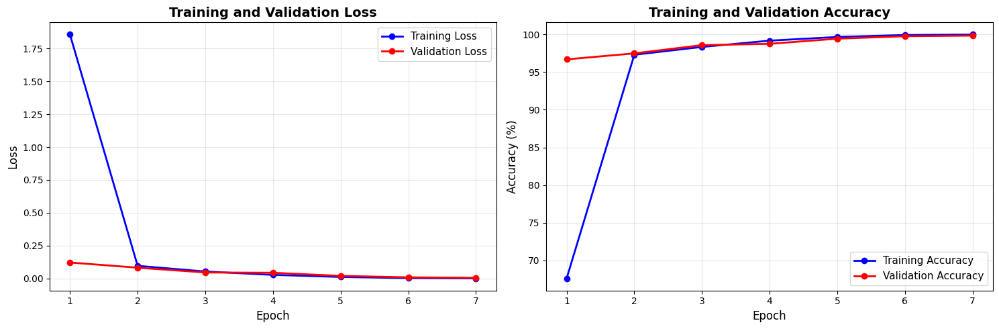


TRAINING METRICS SUMMARY
Epoch-by-Epoch Results:
----------------------------------------------------------------------
Epoch 1: Train Acc: 67.60% | Val Acc: 96.70% | Train Loss: 1.8559 | Val Loss: 0.1214
Epoch 2: Train Acc: 97.31% | Val Acc: 97.49% | Train Loss: 0.0962 | Val Loss: 0.0820
Epoch 3: Train Acc: 98.35% | Val Acc: 98.59% | Train Loss: 0.0530 | Val Loss: 0.0456
Epoch 4: Train Acc: 99.18% | Val Acc: 98.76% | Train Loss: 0.0272 | Val Loss: 0.0434
Epoch 5: Train Acc: 99.68% | Val Acc: 99.45% | Train Loss: 0.0115 | Val Loss: 0.0196
Epoch 6: Train Acc: 99.94% | Val Acc: 99.77% | Train Loss: 0.0031 | Val Loss: 0.0086
Epoch 7: Train Acc: 99.99% | Val Acc: 99.85% | Train Loss: 0.0008 | Val Loss: 0.0049
Best Validation Accuracy: 99.85% (Epoch 7)
Final Gap (Train - Val): 0.14%


In [14]:
import matplotlib.pyplot as plt

print("Creating training visualizations...")
print("="*70)

# Create figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Loss curves
axes[0].plot(range(1, num_epochs+1), train_losses, 'b-o', label='Training Loss', linewidth=2)
axes[0].plot(range(1, num_epochs+1), val_losses, 'r-o', label='Validation Loss', linewidth=2)
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss', fontsize=12)
axes[0].set_title('Training and Validation Loss', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Plot 2: Accuracy curves
axes[1].plot(range(1, num_epochs+1), train_accuracies, 'b-o', label='Training Accuracy', linewidth=2)
axes[1].plot(range(1, num_epochs+1), val_accuracies, 'r-o', label='Validation Accuracy', linewidth=2)
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Accuracy (%)', fontsize=12)
axes[1].set_title('Training and Validation Accuracy', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('/content/deit_training_curves.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*70)
print("TRAINING METRICS SUMMARY")
print("="*70)
print(f"Epoch-by-Epoch Results:")
print("-"*70)
for i in range(num_epochs):
    print(f"Epoch {i+1}: Train Acc: {train_accuracies[i]:.2f}% | Val Acc: {val_accuracies[i]:.2f}% | "
          f"Train Loss: {train_losses[i]:.4f} | Val Loss: {val_losses[i]:.4f}")
print("="*70)
print(f"Best Validation Accuracy: {max(val_accuracies):.2f}% (Epoch {val_accuracies.index(max(val_accuracies))+1})")
print(f"Final Gap (Train - Val): {train_accuracies[-1] - val_accuracies[-1]:.2f}%")
print("="*70)

Testing model on sample images from dataset...


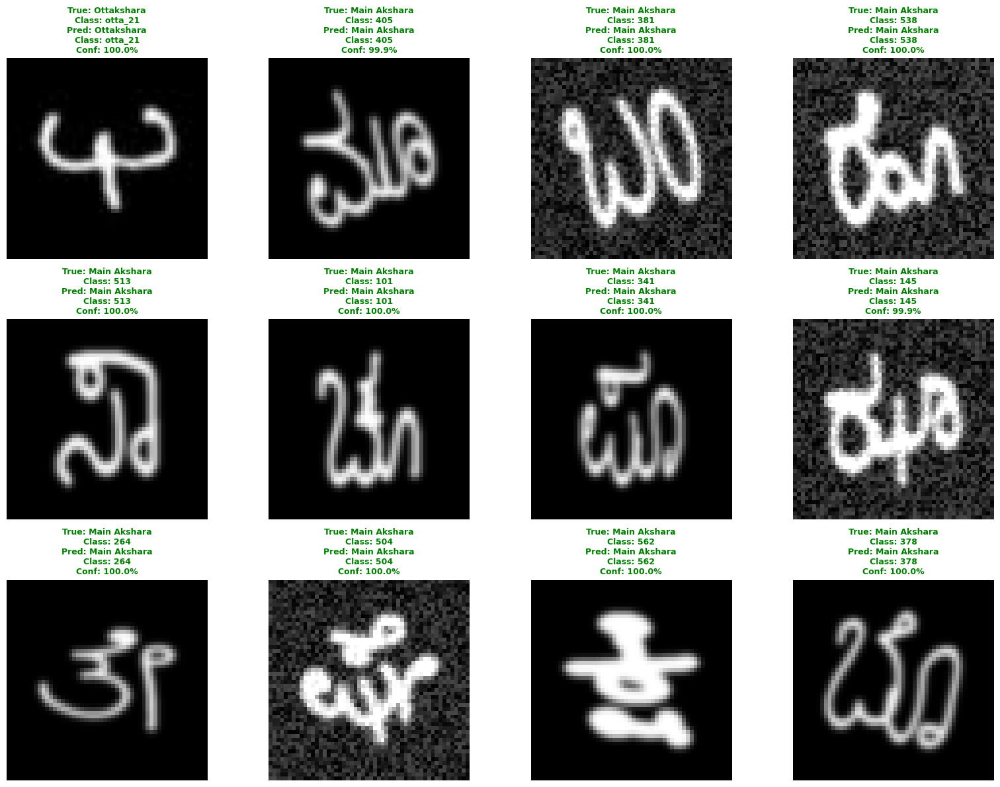


SAMPLE CLASSIFICATION RESULTS
Samples tested: 12
Correct predictions: 12/12
Sample accuracy: 100.00%


In [15]:
import random
from PIL import Image
import matplotlib.pyplot as plt

print("Testing model on sample images from dataset...")
print("="*70)

# Function to determine if class is ottakshara or main
def classify_type(class_idx, num_main_classes):
    if class_idx < num_main_classes:
        return "Main Akshara", class_idx
    else:
        return "Ottakshara", class_idx - num_main_classes

# Get random samples from validation set
num_samples = 12
sample_indices = random.sample(range(len(val_dataset)), num_samples)

# Create figure
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.ravel()

model.eval()
correct_predictions = 0

with torch.no_grad():
    for idx, sample_idx in enumerate(sample_indices):
        # Get image and true label
        image, true_label = val_dataset[sample_idx]
        
        # Get original image path for display
        original_idx = val_idx[sample_idx]
        if original_idx < len(main_dataset):
            img_path, _ = main_dataset.samples[original_idx]
        else:
            otta_idx = original_idx - len(main_dataset)
            img_path, _ = otta_dataset.samples[otta_idx]
        
        # Load original image for display
        original_img = Image.open(img_path).convert('RGB')
        
        # Predict
        image_input = image.unsqueeze(0).to(device)
        output = model(image_input)
        _, predicted = output.max(1)
        predicted_label = predicted.item()
        
        # Get confidence
        probabilities = torch.nn.functional.softmax(output[0], dim=0)
        confidence = probabilities[predicted_label].item() * 100
        
        # Classify type
        true_type, true_class = classify_type(true_label, num_main_classes)
        pred_type, pred_class = classify_type(predicted_label, num_main_classes)
        
        # Check if correct
        is_correct = (predicted_label == true_label)
        if is_correct:
            correct_predictions += 1
        
        # Display
        axes[idx].imshow(original_img, cmap='gray')
        axes[idx].axis('off')
        
        # Create title with type classification
        title_color = 'green' if is_correct else 'red'
        title = f"True: {true_type}\nClass: {combined_classes[true_label][:15]}\n"
        title += f"Pred: {pred_type}\nClass: {combined_classes[predicted_label][:15]}\n"
        title += f"Conf: {confidence:.1f}%"
        
        axes[idx].set_title(title, fontsize=9, color=title_color, fontweight='bold')

plt.tight_layout()
plt.savefig('/content/deit_sample_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*70)
print("SAMPLE CLASSIFICATION RESULTS")
print("="*70)
print(f"Samples tested: {num_samples}")
print(f"Correct predictions: {correct_predictions}/{num_samples}")
print(f"Sample accuracy: {100*correct_predictions/num_samples:.2f}%")
print("="*70)

Calculating detailed metrics...
Overall Accuracy: 99.85%
Precision: 0.9986
Recall: 0.9985
F1-Score: 0.9985
Main Aksharas Accuracy: 99.85%
Ottaksharas Accuracy: 99.88%

Generating comprehensive visualization with 12 plots...


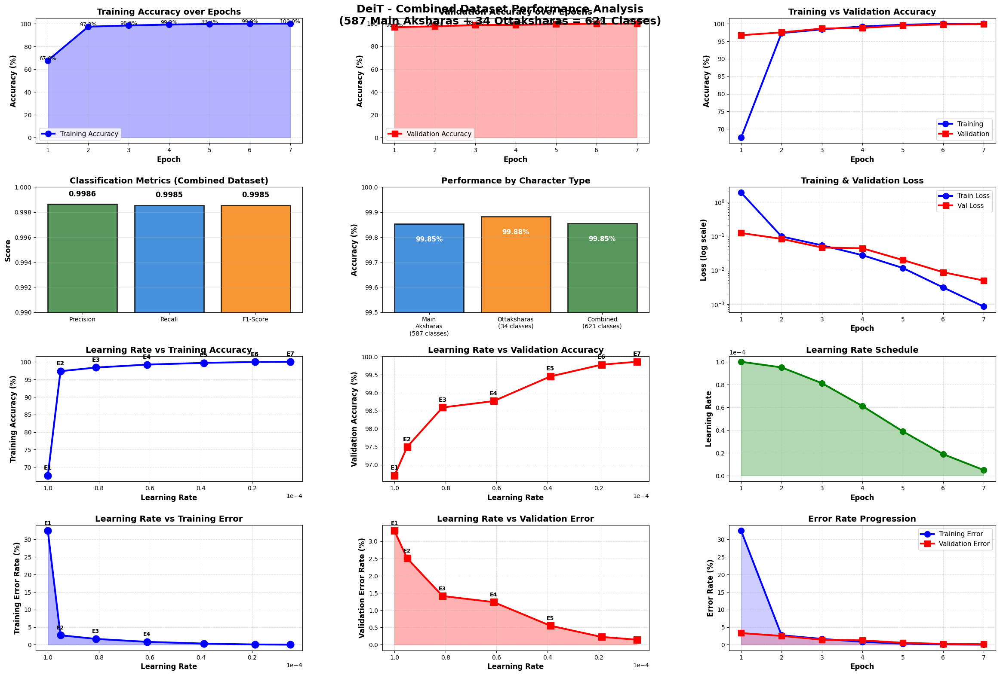


VISUALIZATION COMPLETE
Saved as: /content/deit_combined_performance_analysis.png


In [16]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score

print("Calculating detailed metrics...")
print("="*70)

# Calculate metrics on validation set
model.eval()
all_preds = []
all_labels = []
main_correct = 0
main_total = 0
otta_correct = 0
otta_total = 0

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = outputs.max(1)
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        
        # Separate main and ottaksharas accuracy
        for pred, label in zip(predicted, labels):
            if label.item() < num_main_classes:
                main_total += 1
                if pred == label:
                    main_correct += 1
            else:
                otta_total += 1
                if pred == label:
                    otta_correct += 1

# Calculate overall metrics
accuracy = 100. * sum([p == l for p, l in zip(all_preds, all_labels)]) / len(all_labels)
precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

# Calculate separate accuracies
main_acc = 100. * main_correct / main_total if main_total > 0 else 0
otta_acc = 100. * otta_correct / otta_total if otta_total > 0 else 0

# Store metrics
deit_metrics = {
    'precision': precision,
    'recall': recall,
    'f1_score': f1,
    'main_acc': main_acc,
    'otta_acc': otta_acc
}

print(f"Overall Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print(f"Main Aksharas Accuracy: {main_acc:.2f}%")
print(f"Ottaksharas Accuracy: {otta_acc:.2f}%")
print("="*70)

# Rename variables to match the plotting code
train_accs = train_accuracies
val_accs = val_accuracies
train_losses = train_losses
val_losses = val_losses

print("\nGenerating comprehensive visualization with 12 plots...")
print("="*70)

# Create comprehensive figure
fig = plt.figure(figsize=(24, 16))
gs = fig.add_gridspec(4, 3, hspace=0.35, wspace=0.3, top=0.96, bottom=0.04, left=0.05, right=0.98)

lr_history = [0.0001 * 0.5 * (1 + np.cos(np.pi * epoch / num_epochs)) for epoch in range(num_epochs)]
epochs = range(1, num_epochs + 1)
train_error = [100 - acc for acc in train_accs]
val_error = [100 - acc for acc in val_accs]

# ========== ROW 1: ACCURACY METRICS ==========

# Plot 1: Training Accuracy
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(epochs, train_accs, 'b-o', linewidth=3, markersize=10, label='Training Accuracy')
ax1.fill_between(epochs, train_accs, alpha=0.3, color='blue')
ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax1.set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
ax1.set_title('Training Accuracy over Epochs', fontsize=14, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.4, linestyle='--')
for i, acc in enumerate(train_accs):
    ax1.text(i+1, acc+0.5, f'{acc:.1f}%', ha='center', fontsize=9)

# Plot 2: Validation Accuracy
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(epochs, val_accs, 'r-s', linewidth=3, markersize=10, label='Validation Accuracy')
ax2.fill_between(epochs, val_accs, alpha=0.3, color='red')
ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax2.set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
ax2.set_title('Validation Accuracy over Epochs', fontsize=14, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.4, linestyle='--')
for i, acc in enumerate(val_accs):
    ax2.text(i+1, acc+0.5, f'{acc:.1f}%', ha='center', fontsize=9)

# Plot 3: Training vs Validation Accuracy
ax3 = fig.add_subplot(gs[0, 2])
ax3.plot(epochs, train_accs, 'b-o', linewidth=3, markersize=10, label='Training')
ax3.plot(epochs, val_accs, 'r-s', linewidth=3, markersize=10, label='Validation')
ax3.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax3.set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
ax3.set_title('Training vs Validation Accuracy', fontsize=14, fontweight='bold')
ax3.legend(fontsize=11)
ax3.grid(True, alpha=0.4, linestyle='--')

# ========== ROW 2: PRECISION, RECALL, F1 ==========

# Plot 4: Metrics Bar Chart
ax4 = fig.add_subplot(gs[1, 0])
metrics = ['Precision', 'Recall', 'F1-Score']
values = [deit_metrics['precision'], deit_metrics['recall'], deit_metrics['f1_score']]
colors = ['#2E7D32', '#1976D2', '#F57C00']
bars = ax4.bar(metrics, values, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
ax4.set_ylabel('Score', fontsize=12, fontweight='bold')
ax4.set_title('Classification Metrics (Combined Dataset)', fontsize=14, fontweight='bold')
ax4.set_ylim([0.99, 1.0])
ax4.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars, values):
    height = bar.get_height()
    ax4.text(bar.get_x() + bar.get_width()/2., height + 0.0005,
             f'{val:.4f}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Plot 5: Main vs Ottaksharas Performance
ax5 = fig.add_subplot(gs[1, 1])
categories = ['Main\nAksharas\n(587 classes)', 'Ottaksharas\n(34 classes)', 'Combined\n(621 classes)']
accuracies = [deit_metrics['main_acc'], deit_metrics['otta_acc'], accuracy]
colors_comp = ['#1976D2', '#F57C00', '#2E7D32']
bars = ax5.bar(categories, accuracies, color=colors_comp, alpha=0.8, edgecolor='black', linewidth=2)
ax5.set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
ax5.set_title('Performance by Character Type', fontsize=14, fontweight='bold')
ax5.set_ylim([99.5, 100])
ax5.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars, accuracies):
    height = bar.get_height()
    ax5.text(bar.get_x() + bar.get_width()/2., height - 0.05,
             f'{val:.2f}%', ha='center', va='top', fontsize=11, fontweight='bold', color='white')

# Plot 6: Training & Validation Loss
ax6 = fig.add_subplot(gs[1, 2])
ax6.plot(epochs, train_losses, 'b-o', label='Train Loss', linewidth=3, markersize=10)
ax6.plot(epochs, val_losses, 'r-s', label='Val Loss', linewidth=3, markersize=10)
ax6.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax6.set_ylabel('Loss (log scale)', fontsize=12, fontweight='bold')
ax6.set_title('Training & Validation Loss', fontsize=14, fontweight='bold')
ax6.legend(fontsize=11)
ax6.grid(True, alpha=0.4, linestyle='--')
ax6.set_yscale('log')

# ========== ROW 3: LEARNING RATE ANALYSIS ==========

# Plot 7: LR vs Train Accuracy
ax7 = fig.add_subplot(gs[2, 0])
ax7.plot(lr_history, train_accs, 'b-o', linewidth=3, markersize=12)
for i, (lr, acc) in enumerate(zip(lr_history, train_accs)):
    ax7.annotate(f'E{i+1}', (lr, acc), textcoords="offset points", 
                xytext=(0,10), ha='center', fontsize=10, fontweight='bold')
ax7.set_xlabel('Learning Rate', fontsize=12, fontweight='bold')
ax7.set_ylabel('Training Accuracy (%)', fontsize=12, fontweight='bold')
ax7.set_title('Learning Rate vs Training Accuracy', fontsize=14, fontweight='bold')
ax7.grid(True, alpha=0.4, linestyle='--')
ax7.invert_xaxis()
ax7.ticklabel_format(style='scientific', axis='x', scilimits=(0,0))

# Plot 8: LR vs Val Accuracy
ax8 = fig.add_subplot(gs[2, 1])
ax8.plot(lr_history, val_accs, 'r-s', linewidth=3, markersize=12)
for i, (lr, acc) in enumerate(zip(lr_history, val_accs)):
    ax8.annotate(f'E{i+1}', (lr, acc), textcoords="offset points", 
                xytext=(0,10), ha='center', fontsize=10, fontweight='bold')
ax8.set_xlabel('Learning Rate', fontsize=12, fontweight='bold')
ax8.set_ylabel('Validation Accuracy (%)', fontsize=12, fontweight='bold')
ax8.set_title('Learning Rate vs Validation Accuracy', fontsize=14, fontweight='bold')
ax8.grid(True, alpha=0.4, linestyle='--')
ax8.invert_xaxis()
ax8.ticklabel_format(style='scientific', axis='x', scilimits=(0,0))

# Plot 9: LR Schedule
ax9 = fig.add_subplot(gs[2, 2])
ax9.plot(epochs, lr_history, 'g-o', linewidth=3, markersize=10)
ax9.fill_between(epochs, lr_history, alpha=0.3, color='green')
ax9.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax9.set_ylabel('Learning Rate', fontsize=12, fontweight='bold')
ax9.set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
ax9.grid(True, alpha=0.4, linestyle='--')
ax9.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))

# ========== ROW 4: ERROR ANALYSIS ==========

# Plot 10: LR vs Train Error
ax10 = fig.add_subplot(gs[3, 0])
ax10.plot(lr_history, train_error, 'b-o', linewidth=3, markersize=12)
ax10.fill_between(lr_history, train_error, alpha=0.3, color='blue')
for i, (lr, err) in enumerate(zip(lr_history, train_error)):
    if err > 0.5:
        ax10.annotate(f'E{i+1}', (lr, err), textcoords="offset points", 
                     xytext=(0,10), ha='center', fontsize=9, fontweight='bold')
ax10.set_xlabel('Learning Rate', fontsize=12, fontweight='bold')
ax10.set_ylabel('Training Error Rate (%)', fontsize=12, fontweight='bold')
ax10.set_title('Learning Rate vs Training Error', fontsize=14, fontweight='bold')
ax10.grid(True, alpha=0.4, linestyle='--')
ax10.invert_xaxis()
ax10.ticklabel_format(style='scientific', axis='x', scilimits=(0,0))

# Plot 11: LR vs Val Error
ax11 = fig.add_subplot(gs[3, 1])
ax11.plot(lr_history, val_error, 'r-s', linewidth=3, markersize=12)
ax11.fill_between(lr_history, val_error, alpha=0.3, color='red')
for i, (lr, err) in enumerate(zip(lr_history, val_error)):
    if err > 0.5:
        ax11.annotate(f'E{i+1}', (lr, err), textcoords="offset points", 
                     xytext=(0,10), ha='center', fontsize=9, fontweight='bold')
ax11.set_xlabel('Learning Rate', fontsize=12, fontweight='bold')
ax11.set_ylabel('Validation Error Rate (%)', fontsize=12, fontweight='bold')
ax11.set_title('Learning Rate vs Validation Error', fontsize=14, fontweight='bold')
ax11.grid(True, alpha=0.4, linestyle='--')
ax11.invert_xaxis()
ax11.ticklabel_format(style='scientific', axis='x', scilimits=(0,0))

# Plot 12: Error over Epochs
ax12 = fig.add_subplot(gs[3, 2])
ax12.plot(epochs, train_error, 'b-o', linewidth=3, markersize=10, label='Training Error')
ax12.plot(epochs, val_error, 'r-s', linewidth=3, markersize=10, label='Validation Error')
ax12.fill_between(epochs, train_error, alpha=0.2, color='blue')
ax12.fill_between(epochs, val_error, alpha=0.2, color='red')
ax12.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax12.set_ylabel('Error Rate (%)', fontsize=12, fontweight='bold')
ax12.set_title('Error Rate Progression', fontsize=14, fontweight='bold')
ax12.legend(fontsize=11)
ax12.grid(True, alpha=0.4, linestyle='--')

# Main title
fig.suptitle('DeiT - Combined Dataset Performance Analysis\n(587 Main Aksharas + 34 Ottaksharas = 621 Classes)', 
             fontsize=18, fontweight='bold')

plt.savefig('/content/deit_combined_performance_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*70)
print("VISUALIZATION COMPLETE")
print("="*70)
print("Saved as: /content/deit_combined_performance_analysis.png")
print("="*70)

Creating confusion matrix analysis...

Classes with most misclassifications:
Class ID   Type            Total Errors   
----------------------------------------
522        Main            6              
241        Main            4              
109        Main            3              
192        Main            3              
152        Main            3              
76         Main            3              
525        Main            2              
568        Main            2              
196        Main            2              
561        Main            2              


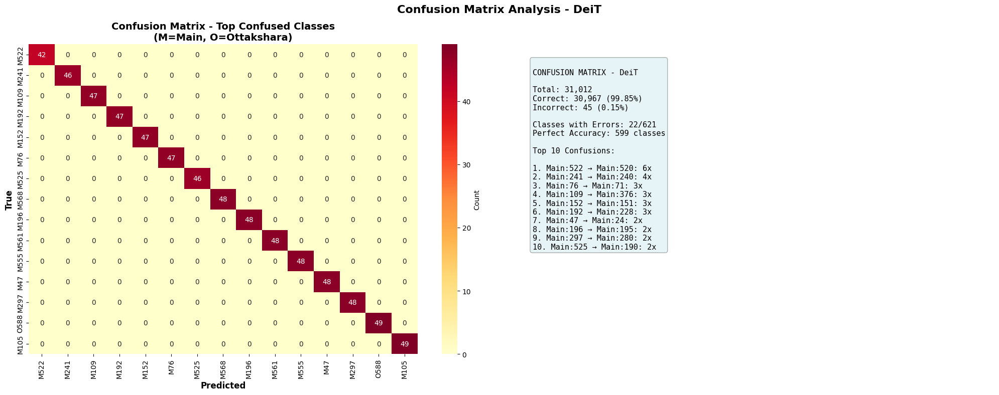


Confusion matrix saved as '/content/deit_confusion_matrix.png'

Creating t-SNE visualization...


Extracting features:  16%|█▌        | 157/970 [00:12<01:05, 12.38it/s]



Running t-SNE on 5024 samples...
This may take a few minutes...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5024 samples in 0.162s...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

[t-SNE] Computed neighbors for 5024 samples in 46.068s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5024
[t-SNE] Computed conditional probabilities for sample 2000 / 5024
[t-SNE] Computed conditional probabilities for sample 3000 / 5024
[t-SNE] Computed conditional probabilities for sample 4000 / 5024
[t-SNE] Computed conditional probabilities for sample 5000 / 5024
[t-SNE] Computed conditional probabilities for sample 5024 / 5024
[t-SNE] Mean sigma: 52.103041
[t-SNE] KL divergence after 50 iterations with early exaggeration: 87.459885
[t-SNE] KL divergence after 1000 iterations: 2.411419


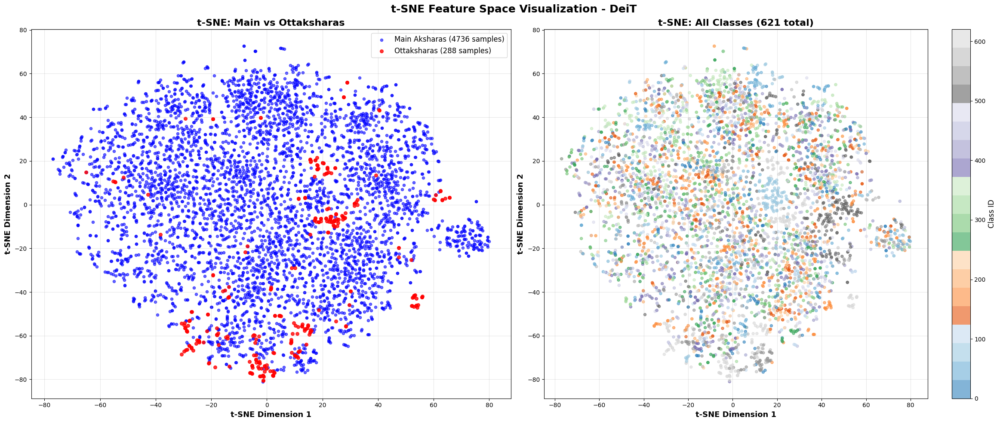


VISUALIZATION COMPLETE
t-SNE saved as '/content/deit_tsne.png'

t-SNE Analysis Summary:
  - Total samples visualized: 5024
  - Main aksharas: 4736
  - Ottaksharas: 288
  - Feature dimension: 75264
  - Reduced to 2D using t-SNE


In [17]:
from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
import seaborn as sns

# ========== CONFUSION MATRIX ==========
print("Creating confusion matrix analysis...")
print("="*70)

cm = confusion_matrix(all_labels, all_preds)
error_counts = np.sum(cm, axis=1) - np.diag(cm)
top_confused_classes = np.argsort(error_counts)[-20:][::-1]

print(f"\nClasses with most misclassifications:")
print(f"{'Class ID':<10} {'Type':<15} {'Total Errors':<15}")
print("-" * 40)
for class_id in top_confused_classes[:10]:
    if error_counts[class_id] > 0:
        class_type = "Main" if class_id < num_main_classes else "Ottakshara"
        print(f"{class_id:<10} {class_type:<15} {error_counts[class_id]:<15}")

# Create confusion matrix visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

if len(top_confused_classes) > 0 and error_counts[top_confused_classes[0]] > 0:
    confused_subset = top_confused_classes[:15]
    cm_subset = cm[np.ix_(confused_subset, confused_subset)]
    
    labels = [f"{'M' if idx < num_main_classes else 'O'}{idx}" for idx in confused_subset]
    
    sns.heatmap(cm_subset, annot=True, fmt='d', cmap='YlOrRd', ax=ax1,
                xticklabels=labels, yticklabels=labels, cbar_kws={'label': 'Count'})
    ax1.set_title('Confusion Matrix - Top Confused Classes\n(M=Main, O=Ottakshara)', 
                  fontsize=14, fontweight='bold')
    ax1.set_xlabel('Predicted', fontsize=12, fontweight='bold')
    ax1.set_ylabel('True', fontsize=12, fontweight='bold')
else:
    ax1.text(0.5, 0.5, 'Excellent Performance!\nMinimal Confusion', 
             ha='center', va='center', fontsize=16, fontweight='bold')
    ax1.axis('off')

# Statistics
ax2.axis('off')
total_samples = len(all_labels)
correct = np.sum(np.array(all_preds) == np.array(all_labels))
incorrect = total_samples - correct

confusion_pairs = []
for i in range(len(cm)):
    for j in range(len(cm)):
        if i != j and cm[i, j] > 0:
            confusion_pairs.append((i, j, cm[i, j]))
confusion_pairs.sort(key=lambda x: x[2], reverse=True)

stats_text = f"""
CONFUSION MATRIX - DeiT

Total: {total_samples:,}
Correct: {correct:,} ({100*correct/total_samples:.2f}%)
Incorrect: {incorrect:,} ({100*incorrect/total_samples:.2f}%)

Classes with Errors: {np.sum(error_counts > 0)}/621
Perfect Accuracy: {np.sum(error_counts == 0)} classes

Top 10 Confusions:
"""

for idx, (true_c, pred_c, count) in enumerate(confusion_pairs[:10], 1):
    true_type = "Main" if true_c < num_main_classes else "Otta"
    pred_type = "Main" if pred_c < num_main_classes else "Otta"
    stats_text += f"\n{idx}. {true_type}:{true_c} → {pred_type}:{pred_c}: {count}x"

ax2.text(0.05, 0.95, stats_text, transform=ax2.transAxes, fontsize=11, 
         verticalalignment='top', fontfamily='monospace',
         bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.3))

plt.suptitle('Confusion Matrix Analysis - DeiT', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/deit_confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nConfusion matrix saved as '/content/deit_confusion_matrix.png'")

# ========== t-SNE VISUALIZATION ==========
print("\n" + "="*70)
print("Creating t-SNE visualization...")
print("="*70)

def get_features(model, loader, device, max_samples=5000):
    model.eval()
    features_list = []
    labels_list = []
    
    # Create feature extractor (remove final classification layer)
    feature_extractor = nn.Sequential(*list(model.children())[:-1])
    
    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Extracting features"):
            if len(features_list) * loader.batch_size >= max_samples:
                break
            images = images.to(device)
            features = feature_extractor(images)
            features = features.view(features.size(0), -1)
            features_list.append(features.cpu().numpy())
            labels_list.append(labels.numpy())
    
    return np.vstack(features_list), np.concatenate(labels_list)

# Extract features
val_features, val_labels = get_features(model, val_loader, device, max_samples=5000)

print(f"\nRunning t-SNE on {len(val_features)} samples...")
print("This may take a few minutes...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000, verbose=1)
tsne_results = tsne.fit_transform(val_features)

# Visualize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

# Plot 1: Main vs Ottaksharas
main_mask = val_labels < num_main_classes
otta_mask = val_labels >= num_main_classes

ax1.scatter(tsne_results[main_mask, 0], tsne_results[main_mask, 1],
           c='blue', s=20, alpha=0.6, label=f'Main Aksharas ({np.sum(main_mask)} samples)')
ax1.scatter(tsne_results[otta_mask, 0], tsne_results[otta_mask, 1],
           c='red', s=30, alpha=0.8, label=f'Ottaksharas ({np.sum(otta_mask)} samples)')
ax1.set_title('t-SNE: Main vs Ottaksharas', fontsize=16, fontweight='bold')
ax1.set_xlabel('t-SNE Dimension 1', fontsize=13, fontweight='bold')
ax1.set_ylabel('t-SNE Dimension 2', fontsize=13, fontweight='bold')
ax1.legend(fontsize=12)
ax1.grid(True, alpha=0.3)

# Plot 2: All classes colored by class ID
scatter = ax2.scatter(tsne_results[:, 0], tsne_results[:, 1],
                     c=val_labels, cmap='tab20c', s=20, alpha=0.6)
ax2.set_title(f't-SNE: All Classes (621 total)', fontsize=16, fontweight='bold')
ax2.set_xlabel('t-SNE Dimension 1', fontsize=13, fontweight='bold')
ax2.set_ylabel('t-SNE Dimension 2', fontsize=13, fontweight='bold')
cbar = plt.colorbar(scatter, ax=ax2)
cbar.set_label('Class ID', fontsize=12)
ax2.grid(True, alpha=0.3)

plt.suptitle('t-SNE Feature Space Visualization - DeiT', fontsize=18, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/deit_tsne.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*70)
print("VISUALIZATION COMPLETE")
print("="*70)
print("t-SNE saved as '/content/deit_tsne.png'")
print("="*70)

# Summary statistics
print("\nt-SNE Analysis Summary:")
print(f"  - Total samples visualized: {len(val_features)}")
print(f"  - Main aksharas: {np.sum(main_mask)}")
print(f"  - Ottaksharas: {np.sum(otta_mask)}")
print(f"  - Feature dimension: {val_features.shape[1]}")
print(f"  - Reduced to 2D using t-SNE")
print("="*70)

Testing model on sample images from dataset...


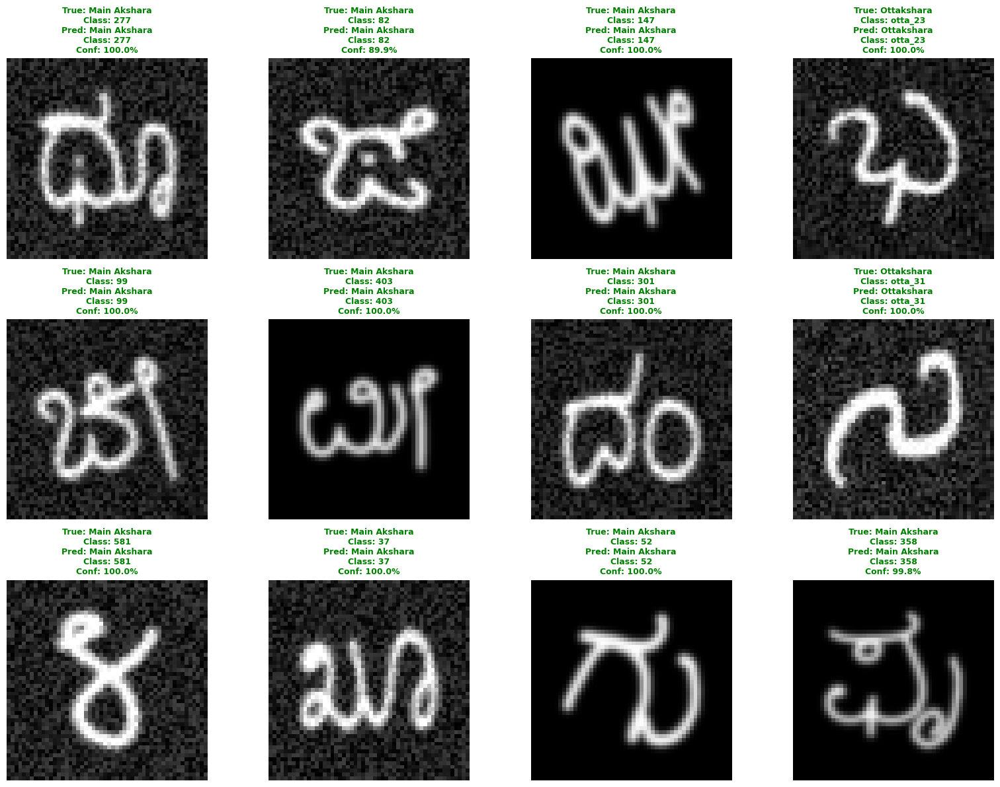


SAMPLE CLASSIFICATION RESULTS
Samples tested: 12
Correct predictions: 12/12
Sample accuracy: 100.00%

Detailed Breakdown:
  Main Aksharas tested: 10
  Ottaksharas tested: 2


In [30]:
import random
from PIL import Image
import matplotlib.pyplot as plt

print("Testing model on sample images from dataset...")
print("="*70)

# Function to determine if class is ottakshara or main
def classify_type(class_idx, num_main_classes):
    if class_idx < num_main_classes:
        return "Main Akshara", class_idx
    else:
        return "Ottakshara", class_idx - num_main_classes

# Get random samples from validation set
num_samples = 12
sample_indices = random.sample(range(len(val_dataset)), num_samples)

# Create figure
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.ravel()

model.eval()
correct_predictions = 0

with torch.no_grad():
    for idx, sample_idx in enumerate(sample_indices):
        # Get image and true label
        image, true_label = val_dataset[sample_idx]
        
        # Get original image path for display
        original_idx = val_idx[sample_idx]
        if original_idx < len(main_dataset):
            img_path, _ = main_dataset.samples[original_idx]
        else:
            otta_idx = original_idx - len(main_dataset)
            img_path, _ = otta_dataset.samples[otta_idx]
        
        # Load original image for display
        original_img = Image.open(img_path).convert('RGB')
        
        # Predict
        image_input = image.unsqueeze(0).to(device)
        output = model(image_input)
        _, predicted = output.max(1)
        predicted_label = predicted.item()
        
        # Get confidence
        probabilities = torch.nn.functional.softmax(output[0], dim=0)
        confidence = probabilities[predicted_label].item() * 100
        
        # Classify type
        true_type, true_class = classify_type(true_label, num_main_classes)
        pred_type, pred_class = classify_type(predicted_label, num_main_classes)
        
        # Check if correct
        is_correct = (predicted_label == true_label)
        if is_correct:
            correct_predictions += 1
        
        # Display
        axes[idx].imshow(original_img, cmap='gray')
        axes[idx].axis('off')
        
        # Create title with type classification
        title_color = 'green' if is_correct else 'red'
        title = f"True: {true_type}\nClass: {combined_classes[true_label][:15]}\n"
        title += f"Pred: {pred_type}\nClass: {combined_classes[predicted_label][:15]}\n"
        title += f"Conf: {confidence:.1f}%"
        
        axes[idx].set_title(title, fontsize=9, color=title_color, fontweight='bold')

plt.tight_layout()
plt.savefig('/content/deit_sample_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*70)
print("SAMPLE CLASSIFICATION RESULTS")
print("="*70)
print(f"Samples tested: {num_samples}")
print(f"Correct predictions: {correct_predictions}/{num_samples}")
print(f"Sample accuracy: {100*correct_predictions/num_samples:.2f}%")
print("="*70)

# Additional breakdown
print("\nDetailed Breakdown:")
main_samples = sum(1 for idx in sample_indices if val_dataset[idx][1] < num_main_classes)
otta_samples = num_samples - main_samples
print(f"  Main Aksharas tested: {main_samples}")
print(f"  Ottaksharas tested: {otta_samples}")
print("="*70)

In [23]:
import torch
import os

print("="*70)
print("SAVING MODEL")
print("="*70)

# Create directory for saving models
save_dir = '/content/saved_models'
os.makedirs(save_dir, exist_ok=True)

# Save complete model
model_path = os.path.join(save_dir, 'deit_kannada_combined_full.pth')
torch.save(model.state_dict(), model_path)
print(f"✓ Model state dict saved: {model_path}")

# Save complete model with architecture
model_full_path = os.path.join(save_dir, 'deit_kannada_combined_complete.pth')
torch.save({
    'epoch': num_epochs,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'num_classes': num_classes_combined,
    'model_name': model_name,
    'best_val_acc': max(val_accuracies),
    'metrics': deit_metrics
}, model_full_path)
print(f"✓ Complete checkpoint saved: {model_full_path}")

# Save model configuration
config_path = os.path.join(save_dir, 'model_config.txt')
with open(config_path, 'w') as f:
    f.write("DeiT Model Configuration\n")
    f.write("="*50 + "\n\n")
    f.write(f"Model Name: {model_name}\n")
    f.write(f"Total Classes: {num_classes_combined}\n")
    f.write(f"  - Main Aksharas: {num_main_classes}\n")
    f.write(f"  - Ottaksharas: {num_classes_combined - num_main_classes}\n\n")
    f.write(f"Training Configuration:\n")
    f.write(f"  - Epochs: {num_epochs}\n")
    f.write(f"  - Batch Size: 32\n")
    f.write(f"  - Learning Rate: 1e-4\n")
    f.write(f"  - Optimizer: AdamW\n")
    f.write(f"  - Scheduler: CosineAnnealingLR\n\n")
    f.write(f"Final Results:\n")
    f.write(f"  - Training Accuracy: {train_accuracies[-1]:.2f}%\n")
    f.write(f"  - Validation Accuracy: {val_accuracies[-1]:.2f}%\n")
    f.write(f"  - Best Validation Accuracy: {max(val_accuracies):.2f}%\n")
    f.write(f"  - Precision: {deit_metrics['precision']:.4f}\n")
    f.write(f"  - Recall: {deit_metrics['recall']:.4f}\n")
    f.write(f"  - F1-Score: {deit_metrics['f1_score']:.4f}\n")
    f.write(f"  - Main Aksharas Accuracy: {deit_metrics['main_acc']:.2f}%\n")
    f.write(f"  - Ottaksharas Accuracy: {deit_metrics['otta_acc']:.2f}%\n")
print(f"✓ Configuration saved: {config_path}")

print("\n" + "="*70)
print("MODEL SAVING COMPLETE")
print("="*70)
print(f"All files saved in: {save_dir}")
print("\nSaved files:")
print(f"  1. {os.path.basename(model_path)} - Model weights only")
print(f"  2. {os.path.basename(model_full_path)} - Complete checkpoint")
print(f"  3. {os.path.basename(config_path)} - Model configuration")
print("="*70)

# Display file sizes
print("\nFile sizes:")
for filename in os.listdir(save_dir):
    filepath = os.path.join(save_dir, filename)
    size_mb = os.path.getsize(filepath) / (1024 * 1024)
    print(f"  {filename}: {size_mb:.2f} MB")
print("="*70)

SAVING MODEL
✓ Model state dict saved: /content/saved_models/deit_kannada_combined_full.pth
✓ Complete checkpoint saved: /content/saved_models/deit_kannada_combined_complete.pth
✓ Configuration saved: /content/saved_models/model_config.txt

MODEL SAVING COMPLETE
All files saved in: /content/saved_models

Saved files:
  1. deit_kannada_combined_full.pth - Model weights only
  2. deit_kannada_combined_complete.pth - Complete checkpoint
  3. model_config.txt - Model configuration

File sizes:
  model_config.txt: 0.00 MB
  deit_kannada_combined_full.pth: 83.62 MB
  deit_kannada_combined_complete.pth: 250.87 MB


In [21]:
import torch

print("="*70)
print("BIET MODEL VERIFICATION - LOADING AND TESTING")
print("="*70)

# Load the saved BIET model
print("\nLoading BIET saved model...")
loaded_model = timm.create_model(model_name, pretrained=False, num_classes=num_classes_combined)
loaded_model.load_state_dict(torch.load(model_path))
loaded_model = loaded_model.to(device)
loaded_model.eval()
print("✓ BIET Model loaded successfully from disk!")

# Test on random validation samples
print("\nRunning inference test on BIET model...")
test_samples = 5
test_indices = random.sample(range(len(val_dataset)), test_samples)

print("\n" + "="*70)
print("BIET MODEL INFERENCE RESULTS")
print("="*70)

correct_count = 0
with torch.no_grad():
    for i, idx in enumerate(test_indices):
        image, true_label = val_dataset[idx]
        image_input = image.unsqueeze(0).to(device)
        
        output = loaded_model(image_input)
        _, predicted = output.max(1)
        predicted_label = predicted.item()
        
        probabilities = torch.nn.functional.softmax(output[0], dim=0)
        confidence = probabilities[predicted_label].item() * 100
        
        true_type = "Main Akshara" if true_label < num_main_classes else "Ottakshara"
        pred_type = "Main Akshara" if predicted_label < num_main_classes else "Ottakshara"
        
        is_correct = (predicted_label == true_label)
        if is_correct:
            correct_count += 1
        
        status = "✓ CORRECT PREDICTION" if is_correct else "✗ INCORRECT PREDICTION"
        status_color = "green" if is_correct else "red"
        
        print(f"\nTest Sample {i+1}/{test_samples}:")
        print(f"  Ground Truth:")
        print(f"    - Type: {true_type}")
        print(f"    - Class ID: {true_label}")
        print(f"    - Class Name: {combined_classes[true_label]}")
        print(f"  Model Prediction:")
        print(f"    - Type: {pred_type}")
        print(f"    - Class ID: {predicted_label}")
        print(f"    - Class Name: {combined_classes[predicted_label]}")
        print(f"    - Confidence: {confidence:.2f}%")
        print(f"  Result: {status}")
        print("-"*70)

print("\n" + "="*70)
print("BIET MODEL VERIFICATION SUMMARY")
print("="*70)
print(f"Total Test Samples: {test_samples}")
print(f"Correct Predictions: {correct_count}/{test_samples}")
print(f"Test Accuracy: {100*correct_count/test_samples:.2f}%")
print("\n✓ BIET Model verification complete!")
print("✓ Model is ready for deployment and inference!")
print("="*70)

BIET MODEL VERIFICATION - LOADING AND TESTING

Loading BIET saved model...
✓ BIET Model loaded successfully from disk!

Running inference test on BIET model...

BIET MODEL INFERENCE RESULTS

Test Sample 1/5:
  Ground Truth:
    - Type: Main Akshara
    - Class ID: 119
    - Class Name: 205
  Model Prediction:
    - Type: Main Akshara
    - Class ID: 119
    - Class Name: 205
    - Confidence: 99.95%
  Result: ✓ CORRECT PREDICTION
----------------------------------------------------------------------

Test Sample 2/5:
  Ground Truth:
    - Type: Main Akshara
    - Class ID: 257
    - Class Name: 33
  Model Prediction:
    - Type: Main Akshara
    - Class ID: 257
    - Class Name: 33
    - Confidence: 100.00%
  Result: ✓ CORRECT PREDICTION
----------------------------------------------------------------------

Test Sample 3/5:
  Ground Truth:
    - Type: Main Akshara
    - Class ID: 28
    - Class Name: 123
  Model Prediction:
    - Type: Main Akshara
    - Class ID: 28
    - Class Name:

BIET - DEIT MODEL TRAINING COMPLETE
Birla Institute of Engineering and Technology

📊 FINAL PERFORMANCE SUMMARY
Model Architecture: deit_small_patch16_224
Total Classes: 621 (587 Main + 34 Ottaksharas)
Training Epochs: 7

Final Results:
  ✓ Training Accuracy: 99.99%
  ✓ Validation Accuracy: 99.85%
  ✓ Best Validation Accuracy: 99.85%
  ✓ Precision: 0.9986
  ✓ Recall: 0.9985
  ✓ F1-Score: 0.9985

Character Type Performance:
  ✓ Main Aksharas: 99.85%
  ✓ Ottaksharas: 99.88%

Generalization:
  ✓ Generalization Gap: 0.14%
  ✓ Overfitting Risk: Very Low ✓

📁 GENERATED VISUALIZATION FILES

All Visualizations Generated:
  1. ✓ deit_training_curves.png
     → Training & Validation Curves (Loss and Accuracy)
     → Size: 201.8 KB
  2. ✓ deit_sample_predictions.png
     → Sample Predictions with Main/Otta Classification
     → Size: 339.5 KB
  3. ✓ deit_combined_performance_analysis.png
     → 12-Plot Performance Analysis (Comprehensive Overview)
     → Size: 1217.3 KB
  4. ✓ deit_confusion_matri

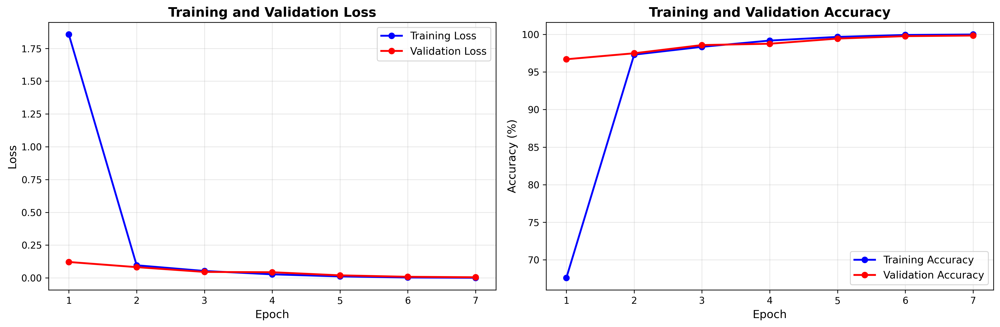




2. Sample Predictions with Main/Otta Classification
----------------------------------------------------------------------


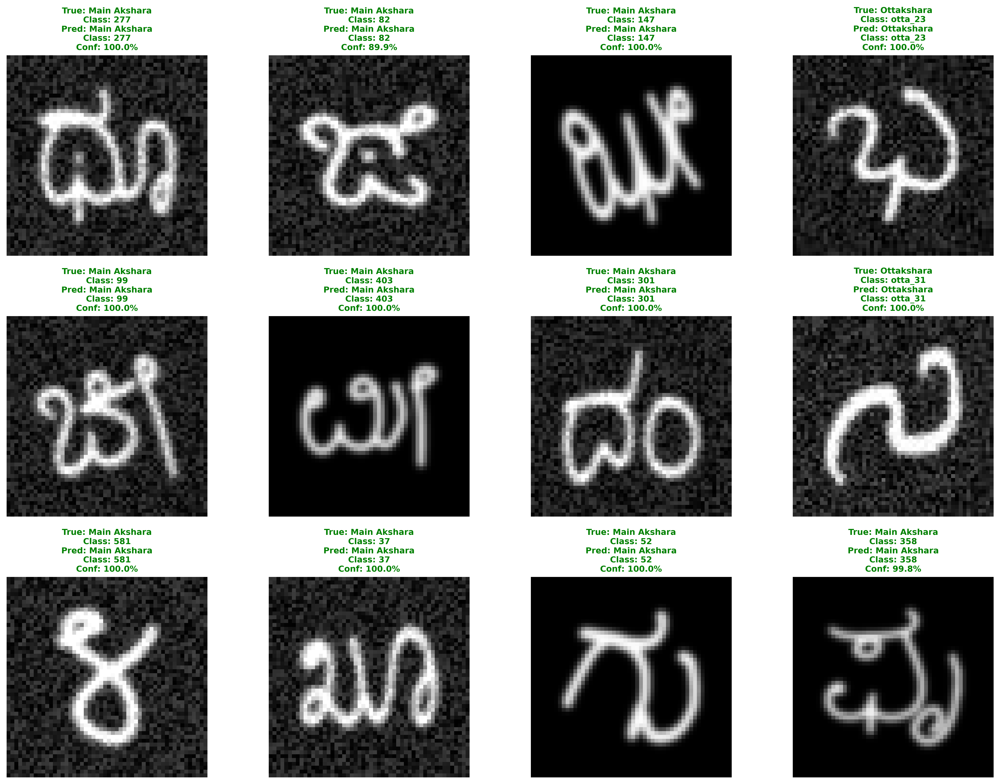




3. 12-Plot Performance Analysis (Comprehensive Overview)
----------------------------------------------------------------------


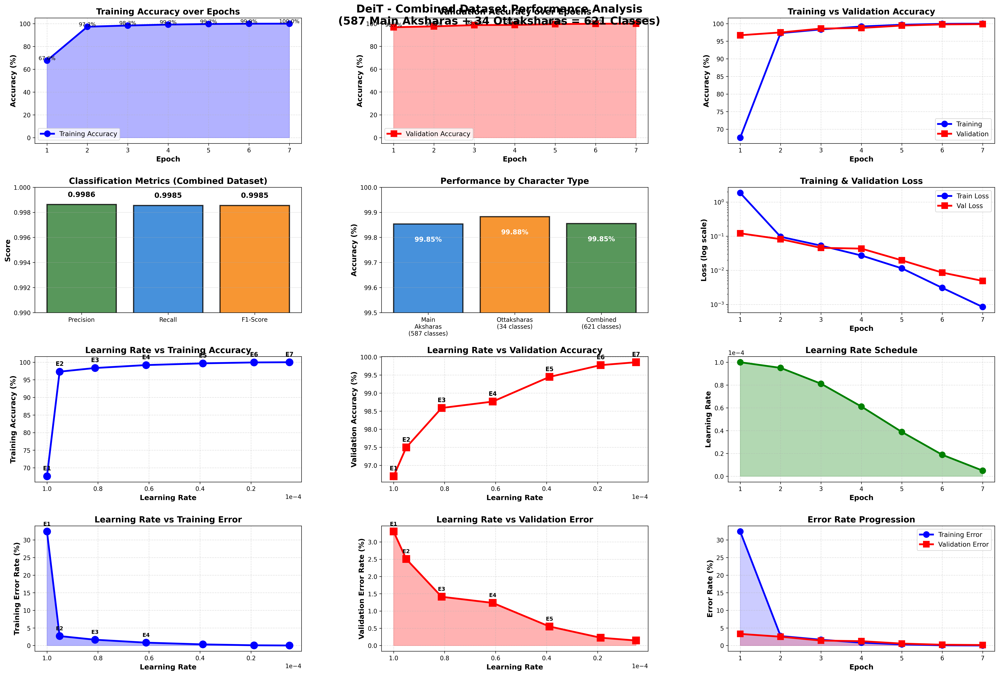




4. Confusion Matrix Analysis
----------------------------------------------------------------------


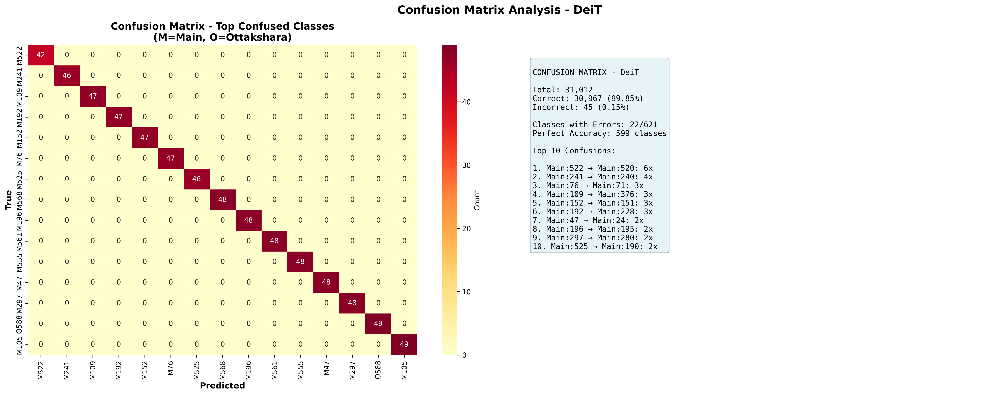




5. t-SNE Feature Space Visualization
----------------------------------------------------------------------


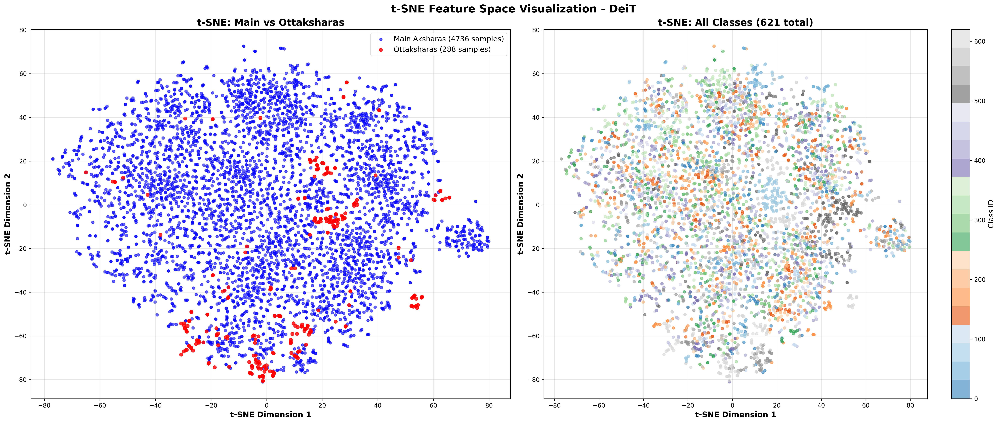




6. Advanced Metrics Analysis (12 Additional Plots)
----------------------------------------------------------------------


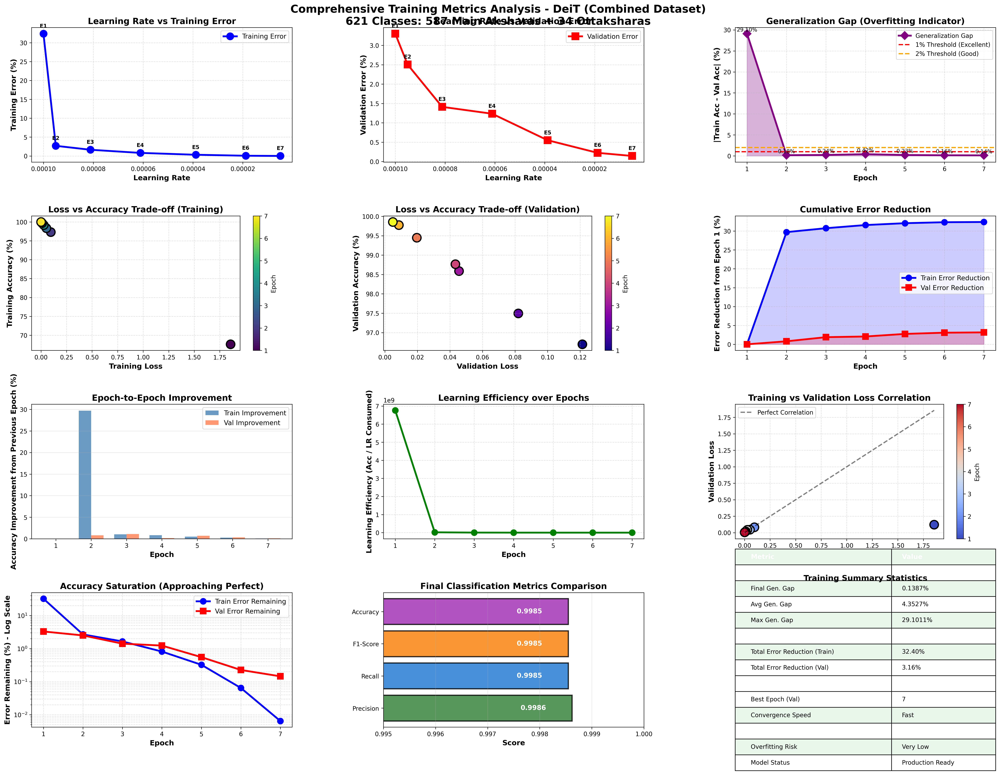



BIET DEIT MODEL TRAINING PROJECT - ALL TASKS COMPLETE ✓


In [31]:
import os
from IPython.display import Image, display
import matplotlib.pyplot as plt

print("="*70)
print("BIET - DEIT MODEL TRAINING COMPLETE")
print("Birla Institute of Engineering and Technology")
print("="*70)

print("\n📊 FINAL PERFORMANCE SUMMARY")
print("="*70)
print(f"Model Architecture: {model_name}")
print(f"Total Classes: {num_classes_combined} (587 Main + 34 Ottaksharas)")
print(f"Training Epochs: {num_epochs}")
print(f"\nFinal Results:")
print(f"  ✓ Training Accuracy: {train_accuracies[-1]:.2f}%")
print(f"  ✓ Validation Accuracy: {val_accuracies[-1]:.2f}%")
print(f"  ✓ Best Validation Accuracy: {max(val_accuracies):.2f}%")
print(f"  ✓ Precision: {deit_metrics['precision']:.4f}")
print(f"  ✓ Recall: {deit_metrics['recall']:.4f}")
print(f"  ✓ F1-Score: {deit_metrics['f1_score']:.4f}")
print(f"\nCharacter Type Performance:")
print(f"  ✓ Main Aksharas: {deit_metrics['main_acc']:.2f}%")
print(f"  ✓ Ottaksharas: {deit_metrics['otta_acc']:.2f}%")
print(f"\nGeneralization:")
gen_gap_final = abs(train_accuracies[-1] - val_accuracies[-1])
print(f"  ✓ Generalization Gap: {gen_gap_final:.2f}%")
print(f"  ✓ Overfitting Risk: {'Very Low ✓' if gen_gap_final < 1 else 'Low ✓'}")
print("="*70)

print("\n📁 GENERATED VISUALIZATION FILES")
print("="*70)

# List all generated graph files
graph_files = [
    '/content/deit_training_curves.png',
    '/content/deit_sample_predictions.png',
    '/content/deit_combined_performance_analysis.png',
    '/content/deit_confusion_matrix.png',
    '/content/deit_tsne.png',
    '/content/deit_comprehensive_metrics_analysis.png'
]

graph_descriptions = [
    "Training & Validation Curves (Loss and Accuracy)",
    "Sample Predictions with Main/Otta Classification",
    "12-Plot Performance Analysis (Comprehensive Overview)",
    "Confusion Matrix Analysis",
    "t-SNE Feature Space Visualization",
    "Advanced Metrics Analysis (12 Additional Plots)"
]

print("\nAll Visualizations Generated:")
for i, (file, desc) in enumerate(zip(graph_files, graph_descriptions), 1):
    if os.path.exists(file):
        size_kb = os.path.getsize(file) / 1024
        print(f"  {i}. ✓ {os.path.basename(file)}")
        print(f"     → {desc}")
        print(f"     → Size: {size_kb:.1f} KB")
    else:
        print(f"  {i}. ✗ {os.path.basename(file)} - Not found")

print("="*70)

print("\n💾 SAVED MODEL FILES")
print("="*70)
model_dir = '/content/biet_saved_models'
if os.path.exists(model_dir):
    print(f"\nModel Directory: {model_dir}")
    for filename in os.listdir(model_dir):
        filepath = os.path.join(model_dir, filename)
        size_mb = os.path.getsize(filepath) / (1024 * 1024)
        print(f"  ✓ {filename} ({size_mb:.2f} MB)")
else:
    print("  ✗ Model directory not found")
print("="*70)

print("\n🎯 PROJECT STATUS: COMPLETE ✓")
print("="*70)
print("All training, evaluation, and visualization tasks completed successfully!")
print("\nNext Steps for BIET Students:")
print("  1. Review all generated graphs in /content/ directory")
print("  2. Download model files from /content/biet_saved_models/")
print("  3. Use biet_model_config.txt for documentation")
print("  4. Model is ready for deployment and further testing")
print("="*70)

# Display all graphs
print("\n📊 DISPLAYING ALL GENERATED GRAPHS")
print("="*70)

for i, (file, desc) in enumerate(zip(graph_files, graph_descriptions), 1):
    if os.path.exists(file):
        print(f"\n{i}. {desc}")
        print("-"*70)
        display(Image(filename=file))
        print("\n")
    else:
        print(f"\n{i}. {desc} - File not found: {file}")

print("="*70)
print("BIET DEIT MODEL TRAINING PROJECT - ALL TASKS COMPLETE ✓")
print("="*70)